# Stellar Classification EDA
## Content
The data consists of 100,000 observations of space taken by the SDSS (Sloan Digital Sky Survey). Every observation is described by 17 feature columns and 1 class column which identifies it to be either a star, galaxy or quasar.

obj_ID = Object Identifier, the unique value that identifies the object in the image catalog used by the CAS
alpha = Right Ascension angle (at J2000 epoch)
delta = Declination angle (at J2000 epoch)
u = Ultraviolet filter in the photometric system
g = Green filter in the photometric system
r = Red filter in the photometric system
i = Near Infrared filter in the photometric system
z = Infrared filter in the photometric system
run_ID = Run Number used to identify the specific scan
rereun_ID = Rerun Number to specify how the image was processed
cam_col = Camera column to identify the scanline within the run
field_ID = Field number to identify each field
spec_obj_ID = Unique ID used for optical spectroscopic objects (this means that 2 different observations with the same spec_obj_ID must share the output class)
class = object class (galaxy, star or quasar object)
redshift = redshift value based on the increase in wavelength
plate = plate ID, identifies each plate in SDSS
MJD = Modified Julian Date, used to indicate when a given piece of SDSS data was taken
fiber_ID = fiber ID that identifies the fiber that pointed the light at the focal plane in each observation

In [1]:
import warnings

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from matplotlib import style

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
sns.set_theme(style="whitegrid", palette="magma")
style.use('ggplot')

In [3]:
df = pd.read_csv('../dataset/star_classification.csv')
df.head()

,obj_ID,alpha,delta,u,g,r,i,z,run_ID,rerun_ID,cam_col,field_ID,spec_obj_ID,class,redshift,plate,MJD,fiber_ID
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


In [4]:
df.shape

(100000, 18)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   obj_ID       100000 non-null  float64
 1   alpha        100000 non-null  float64
 2   delta        100000 non-null  float64
 3   u            100000 non-null  float64
 4   g            100000 non-null  float64
 5   r            100000 non-null  float64
 6   i            100000 non-null  float64
 7   z            100000 non-null  float64
 8   run_ID       100000 non-null  int64  
 9   rerun_ID     100000 non-null  int64  
 10  cam_col      100000 non-null  int64  
 11  field_ID     100000 non-null  int64  
 12  spec_obj_ID  100000 non-null  float64
 13  class        100000 non-null  object 
 14  redshift     100000 non-null  float64
 15  plate        100000 non-null  int64  
 16  MJD          100000 non-null  int64  
 17  fiber_ID     100000 non-null  int64  
dtypes: float64(10), int64(7),

### Data preparation

In [6]:
df.columns

Index(['obj_ID', 'alpha', 'delta', 'u', 'g', 'r', 'i', 'z', 'run_ID',
       'rerun_ID', 'cam_col', 'field_ID', 'spec_obj_ID', 'class', 'redshift',
       'plate', 'MJD', 'fiber_ID'],
      dtype='object')

In [7]:
df = df.drop(columns=['obj_ID', 'run_ID', 'rerun_ID', 'field_ID', 'spec_obj_ID', 'fiber_ID', 'plate', 'MJD'])

In [8]:
df.dtypes

alpha       float64
delta       float64
u           float64
g           float64
r           float64
i           float64
z           float64
cam_col       int64
class        object
redshift    float64
dtype: object

In [9]:
df['class'] = df['class'].astype('category')
df['class'].head()

0    GALAXY
1    GALAXY
2    GALAXY
3    GALAXY
4    GALAXY
Name: class, dtype: category
Categories (3, object): ['GALAXY', 'QSO', 'STAR']

In [10]:
df.isnull().sum()

alpha       0
delta       0
u           0
g           0
r           0
i           0
z           0
cam_col     0
class       0
redshift    0
dtype: int64

In [30]:
df.duplicated().sum()

0

We are working with an imbalanced dataset. The majority class is galaxy, followed by star and quasar.

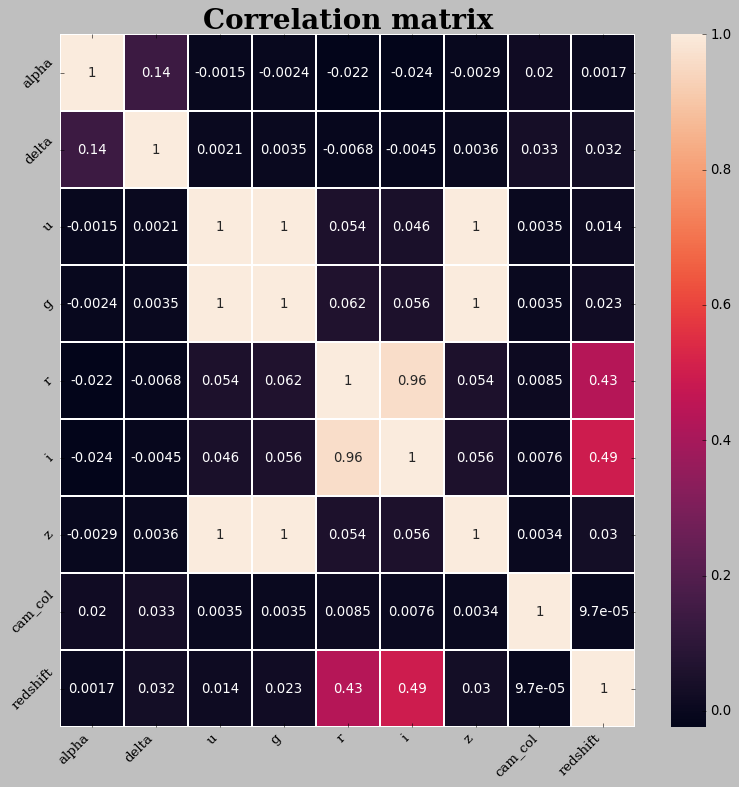

In [27]:
plt.figure(figsize=(10, 10))
sns.heatmap(df.drop(columns=['class']).corr(), annot=True, linewidths=0.1, linecolor='white')
plt.title('Correlation matrix', fontsize=25, fontfamily='serif', fontweight='bold')
plt.xticks(rotation=45, ha='right', fontsize=12, fontfamily='serif')
plt.yticks(rotation=45, ha='right', fontsize=12, fontfamily='serif')
plt.tight_layout()
plt.show()

### Univariate analysis

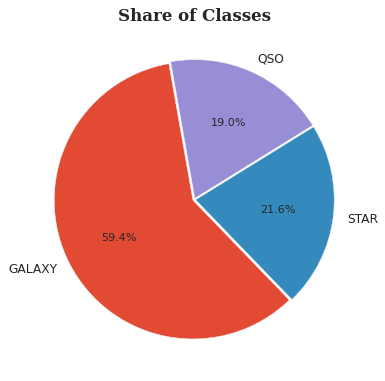

In [29]:
plt.figure(figsize=(5, 5))
df['class'].value_counts().plot.pie(explode=[0.01, 0.01, 0.01], autopct='%1.1f%%', shadow=False, startangle=100)
plt.title('Share of Classes', fontsize=15, fontfamily='serif', fontweight='bold')
plt.ylabel('')
plt.tight_layout()
plt.show()

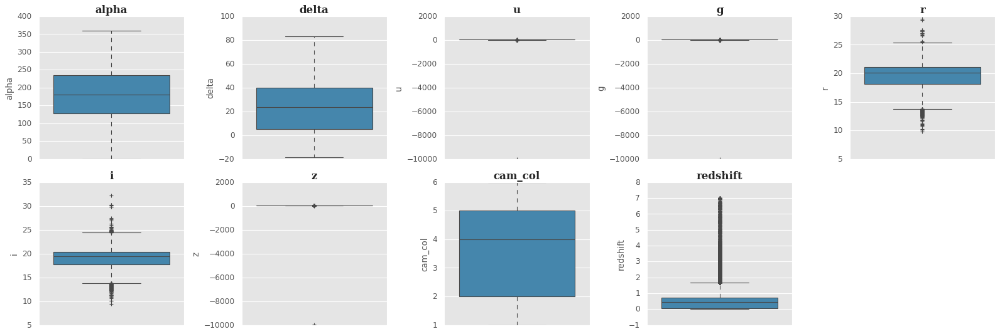

In [32]:
# check for outliers
plt.figure(figsize=(20, 10))
for i, col in enumerate(df.drop(columns=['class']).columns, start=1):
        plt.subplot(3, 5, i)
        sns.boxplot(df[col])
        plt.title(col, fontsize=15, fontfamily='serif', fontweight='bold')
        plt.tight_layout()
plt.show()

### PCA

In [4]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X = df.drop(columns=['class'])
X = scaler.fit_transform(X)
pca = PCA()
pca.fit(X)

PCA()

ValueError: x and y must have same first dimension, but have shapes (9,) and (17,)

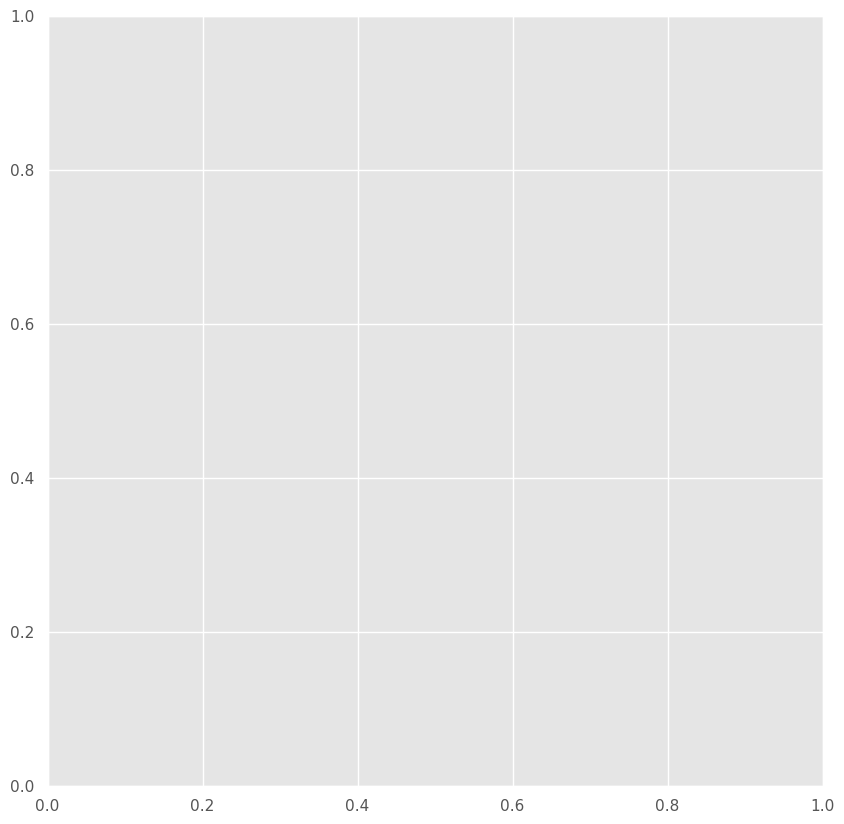

In [5]:
plt.figure(figsize=(10, 10))
plt.plot(range(1, 10), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.title('Explained Variance by Components', fontsize=15, fontfamily='serif', fontweight='bold')
plt.xlabel('Number of Components', fontsize=12, fontfamily='serif')
plt.ylabel('Cumulative Explained Variance', fontsize=12, fontfamily='serif')
plt.tight_layout()
plt.show()

In [6]:
# plot 3d pca using plotly
import plotly.express as px

pca = PCA(n_components=3)
X_pca = pca.fit_transform(X)
df_pca = pd.DataFrame(X_pca, columns=['pca1', 'pca2', 'pca3'])
df_pca['class'] = df['class']
fig = px.scatter_3d(df_pca, x='pca1', y='pca2', z='pca3', color='class', opacity=0.7)
fig.show()

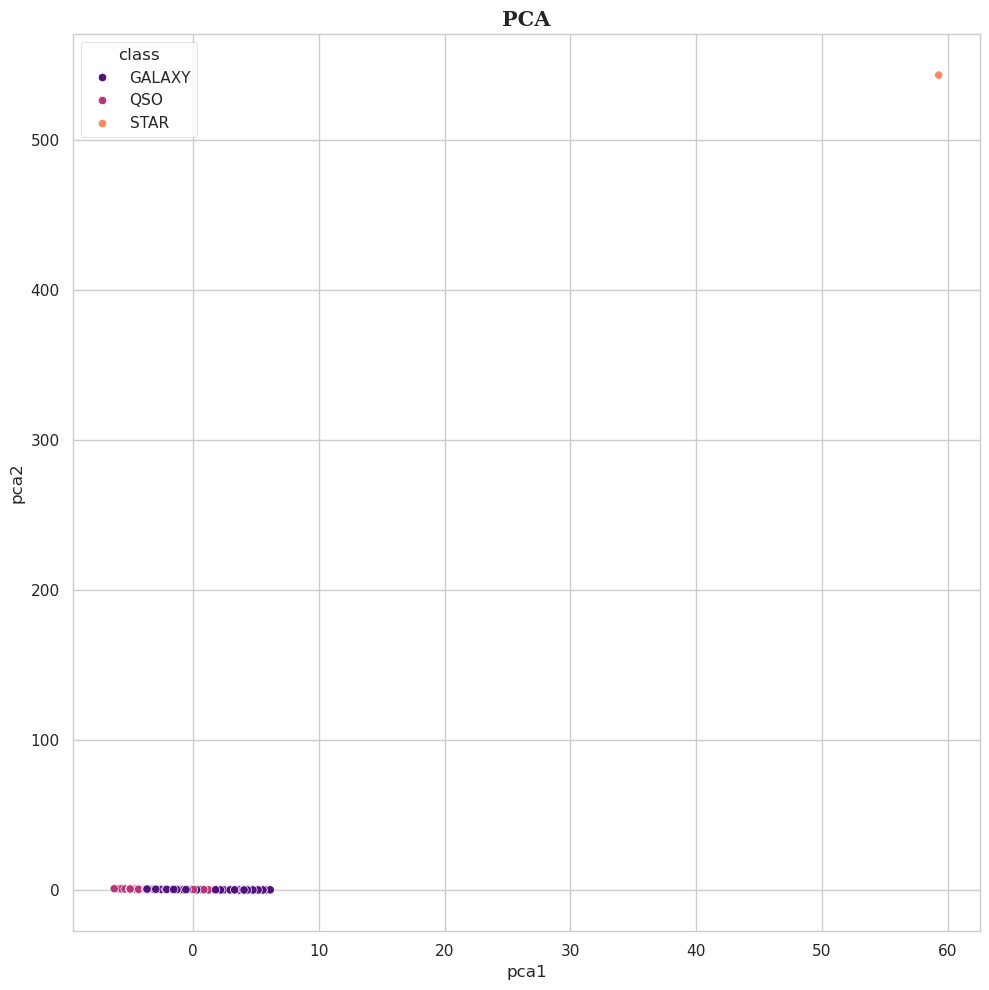

In [7]:
# make 2d pca
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
df_pca = pd.DataFrame(X_pca, columns=['pca1', 'pca2'])
df_pca['class'] = df['class']
plt.figure(figsize=(10, 10))
sns.scatterplot(data=df_pca, x='pca1', y='pca2', hue='class', palette='magma')
plt.title('PCA', fontsize=15, fontfamily='serif', fontweight='bold')
plt.tight_layout()
plt.show()